In [1]:
!where python

c:\Users\HK-Laptop-V639\Documents\GitHub\696\env696\Scripts\python.exe
C:\Users\HK-Laptop-V639\AppData\Local\Programs\Python\Python312\python.exe
C:\Users\HK-Laptop-V639\AppData\Local\Microsoft\WindowsApps\python.exe


In [2]:
# run this code to make sure you install all the required libraries
# be sure you are in virtual environment before install, otherwise it will overwrite your local environment

# !pip install -r requirements.txt

In [3]:
import pandas as pd
import numpy as np

In [4]:
pd.set_option("display.max_columns", None)
RANDOM_SEED = 123

In [116]:
# import necessary assets
import joblib

# the text column for deep learning and traditional ml is the same
train = joblib.load('assets/train_deep_learning.joblib')
test = joblib.load('assets/test_deep_learning.joblib')

# Text pre-processing

Tokenization and lemmatization by keeping `{'NOUN', 'VERB', 'ADJ', 'PROPN', 'ADV'}` and remove named entity.

In [6]:
# stop word
from gensim.parsing.preprocessing import STOPWORDS

stopwords = set(STOPWORDS)

stopwords.update([str(i) for i in range(10000)]) # add numeric characters to stop words

custom_stop_words = {'season', 'recap', 'episode', 'episodes', 'series', 'tv', 'blu', 'ray', 'dvd', 'included', 'wa', 'ni', 'na', 'wo', 'ga', 'ova',
                     'unaired', 'anime', 'released', 'characters', 'film', 'animation', 'animated', 'chan', 'kimi', 'boku', 'manga', 'volume', 'volumes',
                      'stories', 'comic', 'collection', 'video', 'story', 'official', 'ovas', 'ore', 'mo', 'artist', 'movie', 'bo', 'bobo', 'desu',
                      'anthology', 'kun', 'bd', 'release', 'recaps', 'aired', 'summary', 'bundled', 'ura', 'directed', 'published', 'chapters',
                      'serialized', 'based', 'magazine', 'edition', 'limited', 'announced', 'original', 'character', 'chapter', 'specials', 'special', 'short',
                      'second', 'shorts', 'featuring', 'new', 'version', 'main', 'features', 'created', 'adaptation', 'tales', 'set', 'events', 'novel'}

stopwords.update(custom_stop_words) # manually add stop words which are dominant but meaningless in the previous topic modeling result

## Text processing for LDA and NMF

In [7]:
train_non_BERT = train.copy()
train_BERT = train.copy()

In [8]:
# tokenization and lemmatization
import spacy

POS_TO_KEEP = {'NOUN', 'VERB', 'ADJ', 'PROPN', 'ADV'}

nlp = spacy.load('en_core_web_sm')

def tokenization(doc):
    """
    Filter out number.
    Remove person, organization, and location entities.
    Return lemma if its POS is in `POS_TO_KEEP` and not in stop_words.
    """
    tokens = []

    for token in doc:
        if token.is_digit:
            # filter out numeric tokens
            continue

        if token.pos_ in POS_TO_KEEP and not token.lemma_ in stopwords and not token.ent_type_ in ['PERSON', 'ORG', 'GPE']:
            # return lemma if its POS is in `POS_TO_KEEP` and not in stop_words and not person, organization, and location
            tokens.append(token.lemma_)
    
    return tokens

# use nlp.pipe for batch processing
train_non_BERT['title_en_token'] = [
    tokenization(doc) for doc in nlp.pipe(train_non_BERT['title_english'], batch_size=100, n_process=-1)
]
train_non_BERT['synopsis_token'] = [
    tokenization(doc) for doc in nlp.pipe(train_non_BERT['synopsis'], batch_size=100, n_process=-1)
]

# filter out empty token
train_non_BERT = train_non_BERT[
    train_non_BERT['title_en_token'].apply(lambda x: len(x) > 0) | train_non_BERT['synopsis_token'].apply(lambda x: len(x) > 0)
] # at least title or synopsis should have tokens

print('Number of rows after filtering empty token: ', len(train_non_BERT))

Number of rows after filtering empty token:  19298


In [9]:
# review tokenization
with pd.option_context('display.max_colwidth', None):
    display(train_non_BERT[['title_english', 'title_en_token', 'synopsis', 'synopsis_token']].sample(1))

,title_english,title_en_token,synopsis,synopsis_token
8734,Mirage Of The Past,"[mirage, past]",Music video for the song Kako no Shinkirou by DUSTCELL.,"[music, song]"


Since titles and synopses play different roles (titles are short and often genre-indicative, while synopses provide detailed content descriptions), we use two separate vectorizers.

Titles are shorter and often contain rare, context-rich words that are crucial for capturing unique meaning, while synopses are longer and contain more common words, making them less reliant on capturing rare vocabulary. So, we use a higher `max_features` or `vector_size` for title to ensures it capture these niche terms and their relationships, while use lower for synopsis to focus on the more frequently relevant words.

### tfidf

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer

# initialize title tfidf
tfidf_title = TfidfVectorizer(
    ngram_range=(1,1),  # uni-gram
    min_df=1,           # don't filter rare words as they are important for title
    max_df=0.8,         # filter out very common words
)

# initialize synopsis tfidf
tfidf_synopsis = TfidfVectorizer(
    ngram_range=(1,2),  # uni-gram or bi-gram
    max_features=2000,  # focus on the more frequently relevant words
    min_df=2,           # filter out extremely rare words
    max_df=0.8,         # filter out very common words
)

# train tfidf
title_en_tfidf_matrix = tfidf_title.fit_transform(train_non_BERT['title_en_token'].apply(lambda x: " ".join(x)))
synopsis_tfidf_matrix = tfidf_synopsis.fit_transform(train_non_BERT['synopsis_token'].apply(lambda x: " ".join(x)))

# add result to train df
train_non_BERT['title_en_tfidf'] = [title_en_tfidf_matrix[i] for i in range(title_en_tfidf_matrix.shape[0])]
train_non_BERT['synopsis_tfidf'] = [synopsis_tfidf_matrix[i] for i in range(synopsis_tfidf_matrix.shape[0])]

### Word2Vec

For word embedding, we choose **Word2Vec - Skip-gram** because it tends to capture rare words more effectively (e.g. niche anime/manga-specific vocabulary), comparing to Word2Vec - CBOW and GloVe.

In [11]:
# word embedding
import multiprocessing
from gensim.models import Word2Vec

TITLE_DIM = 300
SYNOPSIS_DIM = 150

# dynamically determine the number of CPU cores
num_workers = multiprocessing.cpu_count()

# train title skipgram model
skipgram_model_title = Word2Vec(
    train_non_BERT['title_en_token'].tolist(),
    sg=1,               # skip-gram
    vector_size=TITLE_DIM,    # title use higher dim
    window=2,           # title use smaller window size
    min_count=1,        # titles may contain rare but important words
    epochs=30,          # title are shorter, need more epochs to train
    workers=num_workers,
    seed=RANDOM_SEED
)

# train synopsis skipgram model
skipgram_model_synopsis = Word2Vec(
    train_non_BERT['synopsis_token'].tolist(),
    sg=1,               # skip-gram
    vector_size=SYNOPSIS_DIM,    # synopsis use lower dim
    window=5,           # synopsis use larger window size
    min_count=2,        # filter out extremely rare words
    epochs=15,
    workers=num_workers,
    seed=RANDOM_SEED
)

# clean tokens that does not exist in the skipgram vocab (because of `min_count`)
model_vocab = set(skipgram_model_synopsis.wv.index_to_key)
train_non_BERT['synopsis_token_skipgram_clean'] = train_non_BERT['synopsis_token'].apply(lambda x: [token for token in x if token in model_vocab])

# apply skipgram model
train_non_BERT['title_en_skipgram'] = train_non_BERT['title_en_token'].apply(lambda x: skipgram_model_title.wv[x] if len(x) > 0 else np.zeros((1, TITLE_DIM)))
train_non_BERT['synopsis_skipgram'] = train_non_BERT['synopsis_token_skipgram_clean'].apply(lambda x: skipgram_model_synopsis.wv[x] if len(x) > 0 else np.zeros((1, SYNOPSIS_DIM)))

# filter out empty token
train_non_BERT = train_non_BERT[
    train_non_BERT['title_en_skipgram'].apply(lambda x: len(x) > 0) | train_non_BERT['synopsis_skipgram'].apply(lambda x: len(x) > 0)
] # at least title or synopsis should have tokens

In [12]:
train_non_BERT[['title_japanese', 'title_english', 'synopsis', 'title_en_tfidf', 'title_en_skipgram', 'synopsis_tfidf', 'synopsis_skipgram']].sample(5)

,title_japanese,title_english,synopsis,title_en_tfidf,title_en_skipgram,synopsis_tfidf,synopsis_skipgram
17489,ヘタレと馬鹿たれ,The Loser and the Airhead,"Yoshiro has had hidden, unrequited feelings fo...","(0, 180)\t1.0","[[-0.0017105198, -0.0020218997, 0.0006120511, ...","(0, 1979)\t0.0804946985037029\n (0, 1040)\t...","[[-0.47040263, -0.04586674, 0.381838, 0.610874..."
10334,PEACE MAKER 鐵,Peacemaker Kurogane,The sword-slashing sequel to Peace Maker is he...,,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","(0, 446)\t0.18954911716848827\n (0, 401)\t0...","[[-0.1392608, 0.012789803, -0.23829122, -0.121..."
18210,皇国の緋色,Scarlet Empire,"Kotetsu Miyasaka, a first-year high school stu...",,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","(0, 1968)\t0.0568566950363918\n (0, 836)\t0...","[[0.1163134, -0.08702084, -0.12972832, 0.32249..."
19611,とらわれごっこ,Stolen Hearts,"Everyone's afraid of Koguma—the biggest, most ...",,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","(0, 974)\t0.0994811678914606\n (0, 1990)\t0...","[[0.32009375, -0.16922572, 0.1802975, 0.345287..."
21851,空想少女,Day Dream Girls,This collection of short stories features girl...,"(0, 3048)\t0.48968318916023423\n (0, 1783)\...","[[-0.11371466, -0.06735973, 0.14624318, -0.026...","(0, 1959)\t0.20404317495382424\n (0, 752)\t...","[[-0.084319465, 0.22239345, 0.5702525, -0.2203..."


## Text Processing for BERTopic

As BERTopic can work directly on plain text, we will use the original title and synopsis as input, with minimal pre-processing, like stop word removal and NER, since anime/manga title and synopsis contain large number of named entities.

We will combine title and synopsis together for BERTopic, as this allows the model to capture a broader semantic representation of each document.

In [13]:
import spacy
import contractions

nlp = spacy.load('en_core_web_sm')

def remove_named_entities(doc):
    tokens = []
    
    for token in doc:
        # remove person, organization, and location entities
        if not token.ent_type_ in ['PERSON', 'ORG', 'GPE']:
            tokens.append(token.text)
    
    return ' '.join(tokens)

def preprocess_texts(texts):
    # expand contractions, such as "cant" -> "can not", preventing it tokenize to ["ca", "nt"]
    expanded_texts = [contractions.fix(text) for text in texts]
    
    # process texts in batches using nlp.pipe for efficiency
    processed_texts = [
        remove_named_entities(doc) for doc in nlp.pipe(expanded_texts, batch_size=100, n_process=-1)
    ]
    
    return processed_texts

# apply the preprocessing function
train_BERT['title_en_clean'] = preprocess_texts(train_BERT['title_english'])
train_BERT['synopsis_clean'] = preprocess_texts(train_BERT['synopsis'])
train_BERT['title_synopsis'] = train_BERT['title_en_clean'] + " " + train_BERT['synopsis_clean']

In [76]:
# embedding
from sentence_transformers import SentenceTransformer

embed_BERT = SentenceTransformer('paraphrase-MiniLM-L12-v2')
title_synopsis_embedded = embed_BERT.encode(train_BERT['title_synopsis'].tolist(), clean_up_tokenization_spaces=True)

# Topic modeling

In [15]:
NUM_OF_TOPIC = 12

## LDA

In [16]:
# combine tfidf title and synopsis together as input of topic modeling
from scipy.sparse import hstack

combined_tfidf_matrix = hstack([title_en_tfidf_matrix, synopsis_tfidf_matrix])

# Combine the feature names from both vectorizers
feature_names_title = tfidf_title.get_feature_names_out().tolist()
feature_names_synopsis = tfidf_synopsis.get_feature_names_out().tolist()
combined_feature_names = feature_names_title + feature_names_synopsis

# mimic the behavior of a single vectorizer for pyLDAvis visualization
class CombinedVectorizer:
    def get_feature_names_out(self):
        return combined_feature_names

In [17]:
# LDA with tfidf title and synopsis
import pyLDAvis
import pyLDAvis.lda_model
from sklearn.decomposition import LatentDirichletAllocation

lda_model = LatentDirichletAllocation(n_components=NUM_OF_TOPIC, random_state=RANDOM_SEED)
lda_topic_distribution = lda_model.fit_transform(combined_tfidf_matrix)

temp_df = pd.DataFrame(lda_topic_distribution)

# the dominant topic for each document
train_non_BERT.loc[:, 'topic_LDA'] = temp_df.idxmax(axis=1)
# the confidence score for each document
train_non_BERT.loc[:, 'topic_LDA_score'] = temp_df.max(axis=1)
# normalize the confidence scores to range between 0 and 1
train_non_BERT.loc[:, 'topic_LDA_score'] = (train_non_BERT['topic_LDA_score'] - train_non_BERT['topic_LDA_score'].min()) / (train_non_BERT['topic_LDA_score'].max() - train_non_BERT['topic_LDA_score'].min())

# visualization
pyLDAvis.enable_notebook()
lda_vis = pyLDAvis.lda_model.prepare(lda_model, combined_tfidf_matrix, CombinedVectorizer(), mds='tsne')
lda_vis

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
7      28.783175 -38.069576       1        1  35.924366
3      51.255901 -16.890100       2        1  24.245057
5       0.700362 -19.091848       3        1  12.612724
9       1.206283 -46.775211       4        1   4.537935
10    -13.066823  27.499271       5        1   3.544803
1       5.411857   6.870932       6        1   3.500460
8      24.797802  -9.873780       7        1   3.489204
4     -23.622215  -0.068005       8        1   3.399713
2      18.555435  31.213409       9        1   3.045945
6      40.920624  12.928613      10        1   3.043692
0     -25.275690 -29.136036      11        1   2.656101, topic_info=             Term        Freq       Total Category  logprob  loglift
9781        music  192.000000  192.000000  Default  30.0000  30.0000
10270        song  173.000000  173.000000  Default  29.0000  29.0000
9782   music song  106.000000  106.000000  Default  28.0000  28.0000
4354         love  405.000000  405.000000  Default  27.0000  27.0000
9536      include  193.000000  193.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
9375         game   14.302265  196.580775  Topic11  -5.2919   1.0077
9779           mr    8.227161   36.774729  Topic11  -5.8449   2.1309
9340        focus    8.470128   54.554807  Topic11  -5.8158   1.7657
9536      include    8.936794  193.259238  Topic11  -5.7621   0.5545
9851      opening    6.972755   18.467374  Topic11  -6.0103   2.6543

[707 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
28         4  0.117395      3rd
28        10  0.704370      3rd
8640       1  0.796338  ability
8640       2  0.038846  ability
8640       3  0.097114  ability
...      ...       ...      ...
10629     10  0.014717    young
10629     11  0.003679    young
10638      1  0.335647   zombie
8626       8  0.866185   zombie
10638      8  0.623344   zombie

[1936 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 4, 6, 10, 11, 2, 9, 5, 3, 7, 1])

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_topic_score_distribution(df, topic_col, score_col, title):
    """
    Function to visualize the distribution of the confidence score for each topic.
    """

    plt.figure(figsize=(10, 8))

    sns.boxplot(x=topic_col, y=score_col, data=df)

    plt.title(f'Distribution of Topic Scores for {title}')
    plt.xlabel('Topic')
    plt.ylabel('Topic Score')
    
    plt.show()

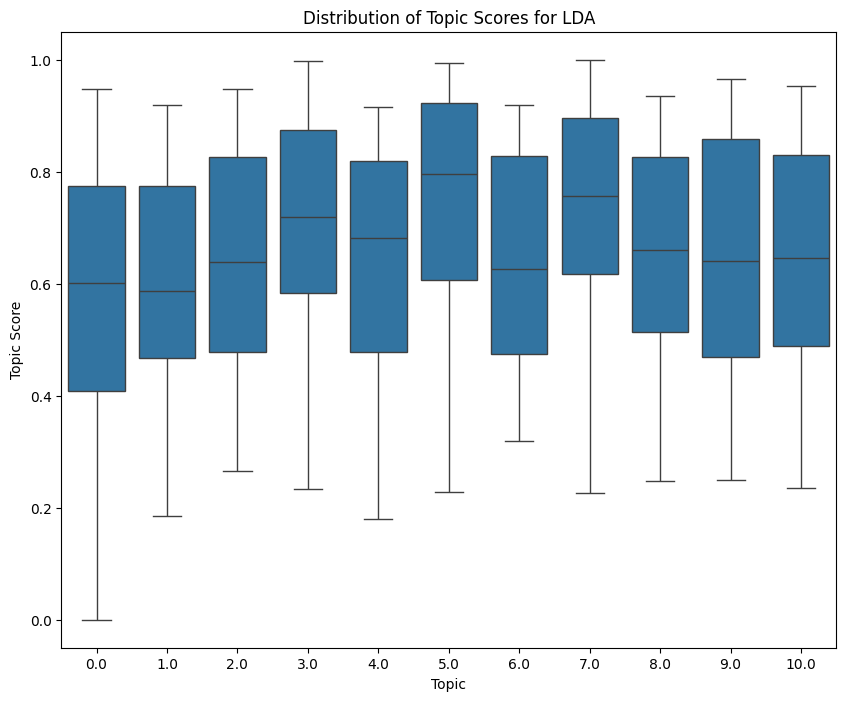

In [47]:
plot_topic_score_distribution(train_non_BERT, 'topic_LDA', 'topic_LDA_score', 'LDA')

In [20]:
# top 20 confidence for each topic
for topic in range(NUM_OF_TOPIC):
    print('topic: ', topic, '\n', train_non_BERT[train_non_BERT['topic_LDA']==topic].sort_values('topic_LDA_score', ascending=False)['title_japanese'].head(20).tolist())

topic:  0 
 ['メダロット', 'アリスたちの標本', '遊☆戯☆王 SEVENS', '러브 팝', 'ヒロインたるもの！〜嫌われヒロインと内緒のお仕事〜', '伊藤潤二自選傑作集', '魔法少女隊アルス the Adventure', 'わりとよくある男子校的恋愛事情', 'ようこそ星のお宿', '異世界転移したら愛犬が最強になりました～シルバーフェンリルと俺が異世界暮らしを始めたら～ THE COMIC', '悪魔さんとお歌', '100万円の女たち', '长江7号爱地球', 'D.Gray-man', 'オーディーン・光子帆船スターライト', '金田一少年の事件簿SP', '幸せのかんづめ', '炬燵猫', '귀여운 야수님!', "Holy Angel's Carol"]
topic:  1 
 ['투신전생기', 'ミカグラ学園組曲', '달콤살벌한 부부', 'BLACK TORCH', 'フルムーンジョーカー', '黑貓警長', '純血+彼氏', 'ムヒョとロージーの魔法律相談事務所', '汉化日记', 'LOVELESS', '化け猫かたって候', '僕が夫に出会うまで', 'サンリオ男子', 'Missウィザード', 'この美術部には問題がある！', 'ようこそ実力至上主義の教室へ', 'これは愛で、恋じゃない', '尻フェチなんかに好かれてたまるか', '답을 찾은 두 소년', '生徒会長に忠告']
topic:  2 
 ['魔法少女特殊戦あすか', '政治の倫理化', '夏目友人帳 陸', '少女椿', 'カノジョはアイツのお墨つき', 'The Dentsu Advertising Awards: Walk Walk', '嘘つきΩは逆らえない!', '拾遗录', '喜羊羊与灰太狼 之兔年顶瓜瓜', 'ブラック・ジャック', '帰還した勇者の後日譚', '君は可愛い恋の奴隷', '犬と猫どっちも飼ってると毎日たのしい', 'しずかに Another 見崎鳴', '朝まで授業chu!', 'オタ友が彼氏になったら、最高、かもしれない', 'トレース 科捜研法医研究員の追想', '我从诸天万界归来', 'ザ・超女[ザ・スーパーギャル]', '魔法亞媽']
topic:  3 
 ['放課後バニラ', '괴물 공작가의 계약 공녀

## NMF

In combining the title and synopsis embeddings for each anime/manga entry, we faced the challenge of differing word lengths. Directly stacking the embeddings could cause imbalance in representing the two sources of information. To address this, we chose to average the embeddings for each entry, allowing us to capture the overall semantic meaning of the entire document without losing the key contextual information. While it does lose some individual word-level granularity, the averaged vector still provides a strong representation of the dominant themes.

In [21]:
# combine skip-gram title and synopsis together as input of topic modeling

train_non_BERT['combined_embedding'] = train_non_BERT.apply(
    lambda row: np.hstack((
        np.mean(row['title_en_skipgram'], axis=0),
        np.mean(row['synopsis_skipgram'], axis=0)
    ))
    , axis=1
)
print("shape before combine: \n", train_non_BERT['title_en_skipgram'][0].shape, train_non_BERT['synopsis_skipgram'][0].shape)
print("shape after combine: \n", train_non_BERT['combined_embedding'][0].shape)

shape before combine: 
 (1, 300) (87, 150)
shape after combine: 
 (450,)


In [22]:
from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler

# convert the series into a 2D numpy array
embedding_matrix = np.vstack(train_non_BERT['combined_embedding'].values)

# apply Min-Max Normalization to due with negative value
min_max_scaler = MinMaxScaler()
embedding_matrix_non_negative = min_max_scaler.fit_transform(embedding_matrix)

nmf_model = NMF(n_components=NUM_OF_TOPIC, random_state=RANDOM_SEED, init="nndsvd", max_iter=20000)
nmf_topic_distribution = nmf_model.fit_transform(embedding_matrix_non_negative)

# find the dominant topic for each document
train_non_BERT['topic_nmf'] = np.argmax(nmf_topic_distribution, axis=1)
# the confidence score for each document
train_non_BERT['topic_nmf_score'] = np.max(nmf_topic_distribution, axis=1)
# normalize the confidence scores to range between 0 and 1
train_non_BERT['topic_nmf_score'] = (train_non_BERT['topic_nmf_score'] - train_non_BERT['topic_nmf_score'].min()) / (train_non_BERT['topic_nmf_score'].max() - train_non_BERT['topic_nmf_score'].min())

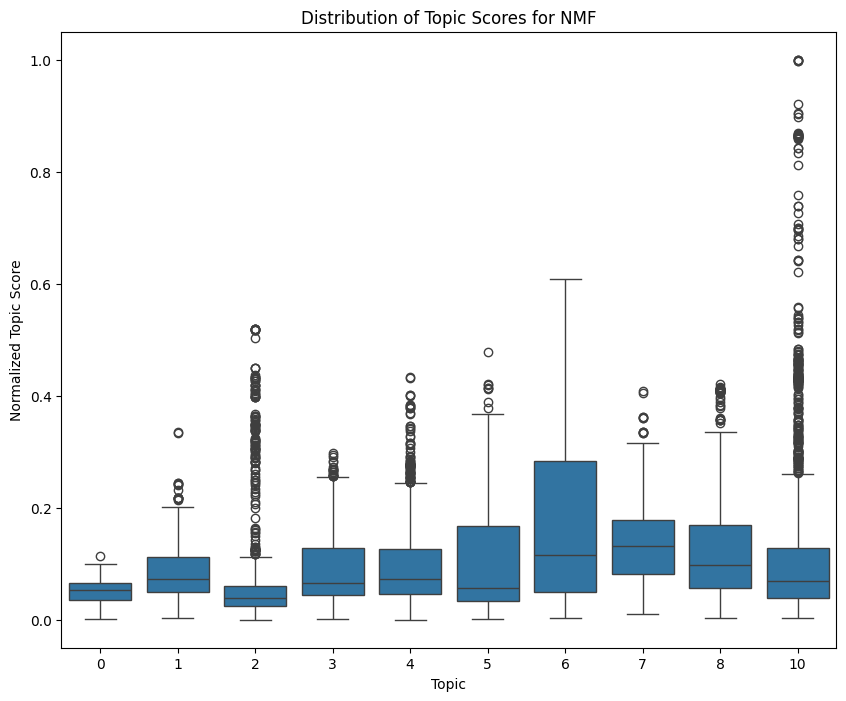

In [23]:
plot_topic_score_distribution(train_non_BERT, 'topic_nmf', 'topic_nmf_score', 'NMF')

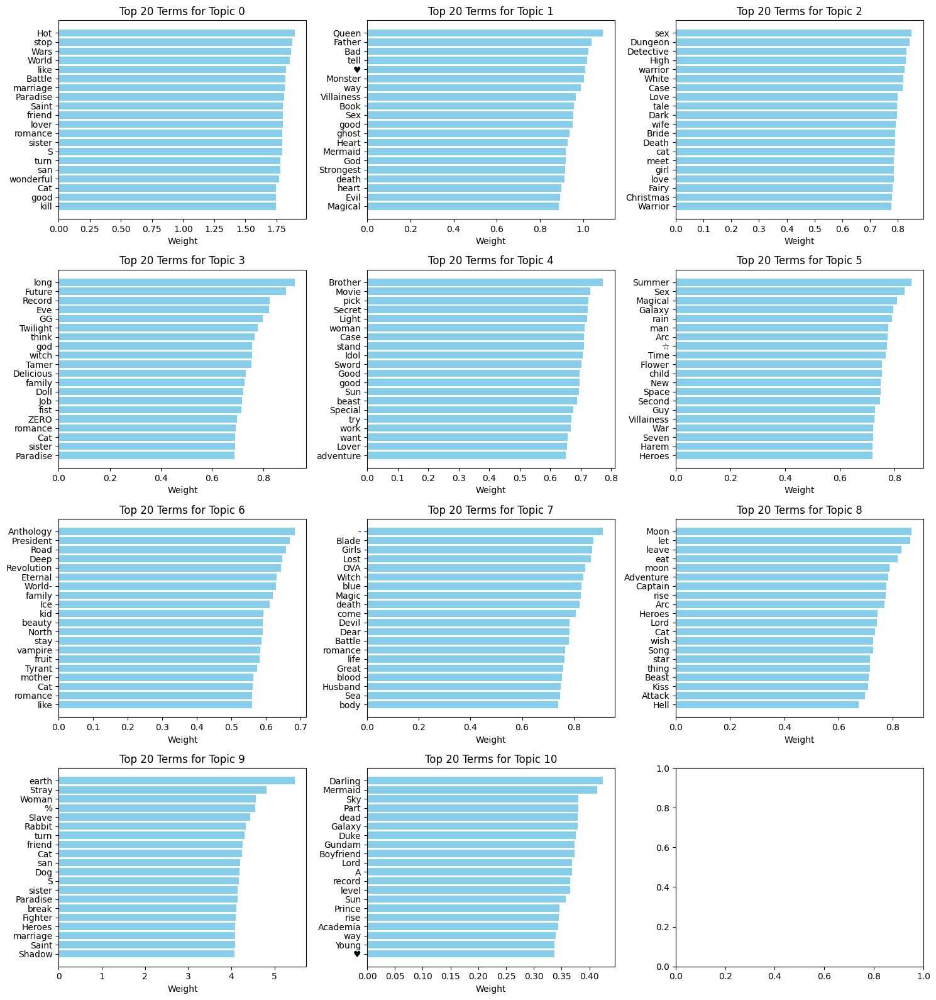

In [24]:
# review top terms for each topic
import matplotlib.pyplot as plt

combined_vocab = list(skipgram_model_title.wv.index_to_key) + list(skipgram_model_synopsis.wv.index_to_key)

def plot_top_terms_per_topic_NMF(model, feature_names, top_n=20, columns=3):
    topic_term_matrix = model.components_
    num_topics = topic_term_matrix.shape[0]
    rows = (num_topics + columns - 1) // columns  # calculate number of rows needed
    
    # set the overall size of the figure
    fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 4))
    axes = axes.flatten()
    
    # loop through each topic and plot the top terms
    for topic_idx, topic in enumerate(topic_term_matrix):
        # get the top terms and their weights for the current topic
        top_term_indices = topic.argsort()[-top_n:][::-1]
        top_terms = [feature_names[i] for i in top_term_indices]
        top_term_weights = topic[top_term_indices]
        
        # plot the bar chart for this topic
        ax = axes[topic_idx] if num_topics > 1 else axes
        ax.barh(top_terms, top_term_weights, color="skyblue")
        ax.set_title(f"Top {top_n} Terms for Topic {topic_idx}")
        ax.invert_yaxis()  # invert to have the highest weight at the top
        ax.set_xlabel("Weight")
    
    plt.tight_layout()
    plt.show()

plot_top_terms_per_topic_NMF(nmf_model, combined_vocab)

In [25]:
# top 20 confidence for each topic
for topic in range(NUM_OF_TOPIC):
    print('topic: ', topic, '\n', train_non_BERT[train_non_BERT['topic_nmf']==topic].sort_values('topic_nmf_score', ascending=False)['title_japanese'].head(20).tolist())

topic:  0 
 ['越天の空', 'ブレンパワード', '逆天至尊', '\u200bスペースサーカス', 'ウルトラマン超闘士激伝 彗星戦神ツイフォン登場', '暗黒神伝承 武神 (Takegami)', 'ウルトラマンSTORY0', '86―エイティシックス―', '皆殺しのアーサー', '舞-HiME戦（EXA）', '戦場のヴァルキュリア -Gallian Chronicles-', '仙界伝 封神演義', '메트로헌터', 'サイレントメビウス', '遊撃宇宙戦艦ナデシコ', '空のカイン', '淫獣学園 La☆Blue Girl 復活篇', '龍眼－ドラゴンアイ－', 'ランドロック', '直球表題 ロボットアニメ-STRAIGHT TITLE-']
topic:  1 
 ['고인의 명복', '斎藤義龍に生まれ変わったので、織田信長に国譲りして長生きするのを目指します!', '世界か彼女か選べない', '사랑받는 언니가 사라진 세계', '世界最高の暗殺者、異世界貴族に転生する', '世界最高の暗殺者、異世界貴族に転生する', 'シリアルキラー異世界に降り立つ', 'きみのために世界はある', 'Re：ゼロから始める異世界生活', 'Re：ゼロから始める異世界生活', 'Re:ゼロから始める異世界生活 氷結の絆', 'Re：ゼロから始める異世界生活', 'Re：ゼロから始める異世界生活『氷結の絆』', 'Re:ゼロから始める異世界生活 第四章 聖域と強欲の魔女', 'Re：ゼロから始める異世界生活', '쌍둥이 남매의 뉴라이프', 'キャラコミックス', 'シャアの日常', '日常 オリジナル次回予告', 'Re:ゼロから始める異世界生活Ex']
topic:  2 
 ['ジオニックフロント 機動戦士ガンダム0079 ジオンの悲憤', '機動戦士ガンダム', '劇場版\u3000機動戦士ガンダム I\u3000特別編', '機動戦士ガンダム0083 STARDUST MEMORY', '機動戦士ガンダムSEED Ｘ Astray', '機動戦士ガンダム 閃光のハサウェイ', '機動戦士ガンダム00', '機動戦士ガンダム00', '機動戦士ガンダム 00F', '機動戦士ガンダム École du Ciel -天空の学-', '新機動

## BERTopic

We use two-step approach: qualitative evaluation and quantitative fine-tuning.

First, we qualitatively evaluate the topics to gain an initial understanding of the suitable configuration and parameters for our dataset. Based on this evaluation, the following configuration was found to be suitable:
- KMeans for clustering
- Number of Topics set between 10 to 12
- combination of unigrams and bigrams
- expand the list of stop words based on previous topic modeling results, removing dominant but meaningless words
- "paraphrase-MiniLM-L12-v2" model performs well for embedding

After establishing a suitable qualitative setup, we move to a quantitative approach using coherence scores to fine-tune hyperparameter.

In [102]:
# Import necessary libraries
from bertopic import BERTopic
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import ParameterGrid
from scipy.spatial.distance import cdist

vectorizer = CountVectorizer(ngram_range=(1, 2), stop_words=list(stopwords))  # uni and bi-gram, with custom stopwords list

# Parameter grid for hyperparameters
param_grid = {
    'n_neighbors': [10, 15],
    'min_dist': [0.1, 0.2],
    'n_components': [2, 5, 10],
    'n_clusters': [10, 11, 12]
}

# Initialize variables to track the best model and its average topic probability
best_model = None
best_topic_probability = -np.inf
best_params = {}

# Function to calculate average topic probability
def calculate_topic_probability(model, reduced_embeddings, topics):
    # Get the cluster centers from KMeans
    cluster_centers = model.hdbscan_model.cluster_centers_

    # Calculate the distance of each document to each cluster center
    distances = cdist(reduced_embeddings, cluster_centers, metric='euclidean')

    # Use a softmax-like transformation to convert distances into a pseudo-probability distribution
    probabilities = np.exp(-distances) / np.exp(-distances).sum(axis=1, keepdims=True)

    # The maximum probability for each document for its assigned topic
    topic_probabilities = [
        prob[topic] if topic != -1 else 0  # Set 0 for documents not assigned to any topic
        for prob, topic in zip(probabilities, topics)
    ]

    # Calculate the average probability across all documents
    return topic_probabilities

# Iterate over the parameter grid
for params in ParameterGrid(param_grid):
    # UMAP model with current parameters
    dim_red_model = UMAP(
        n_neighbors=params['n_neighbors'],
        n_components=params['n_components'],
        min_dist=params['min_dist'],
        metric='cosine',
        random_state=RANDOM_SEED
    )

    # Reduce the dimensionality of the embeddings using UMAP
    reduced_embeddings = dim_red_model.fit_transform(title_synopsis_embedded)
    
    # Create KMeans clustering model using the reduced dimensionality
    cluster_model = KMeans(n_clusters=params['n_clusters'], random_state=RANDOM_SEED)
    
    # Fit KMeans on the UMAP-reduced embeddings
    cluster_model.fit(reduced_embeddings)
    
    # Create BERTopic model with the current configuration
    BERT_model = BERTopic(
        language="english",
        umap_model=dim_red_model,
        hdbscan_model=cluster_model,
        vectorizer_model=vectorizer
    )
    
    # Fit the model
    topics, _ = BERT_model.fit_transform(train_BERT['title_synopsis'], embeddings=title_synopsis_embedded)
    
    # Compute average topic probability for the current model
    topic_probability = calculate_topic_probability(BERT_model, reduced_embeddings, topics)

    avg_topic_probability = np.mean(topic_probability)

    print(f"Testing parameters: {params}, Average Topic Probability: {avg_topic_probability}")
    
    # Update the best model if the current average topic probability is higher
    if avg_topic_probability > best_avg_topic_probability:
        best_avg_topic_probability = avg_topic_probability
        best_topic_probability = topic_probability
        best_model = BERT_model
        best_params = params
        best_topics = topics

print(f"Best parameters: {best_params}")
print(f"Best average topic probability: {best_avg_topic_probability}")

train_BERT['topic_BERTopic'] = best_topics
train_BERT['topic_BERTopic_score'] = best_topic_probability

# Visualize
best_model.visualize_topics()

Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 2, 'n_neighbors': 10}, Average Topic Probability: 0.049908014493268725
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 2, 'n_neighbors': 15}, Average Topic Probability: 0.10768533379582586
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 5, 'n_neighbors': 10}, Average Topic Probability: 0.11605307690158316
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 5, 'n_neighbors': 15}, Average Topic Probability: 0.05886114266297549
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 10, 'n_neighbors': 10}, Average Topic Probability: 0.14692425530868514
Testing parameters: {'min_dist': 0.1, 'n_clusters': 10, 'n_components': 10, 'n_neighbors': 15}, Average Topic Probability: 0.04616467119236787
Testing parameters: {'min_dist': 0.1, 'n_clusters': 11, 'n_components': 2, 'n_neighbors': 10}, Average Topic Probability: 0.07883302165185929
Tes

In [74]:
"""# topic modeling - KMeans
from bertopic import BERTopic
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from scipy.spatial.distance import cdist

NUM_OF_TOPIC = 12

dim_red_model = UMAP(n_neighbors=15,
                    n_components=5,
                    min_dist=0.0,
                    metric='cosine',
                    random_state=RANDOM_SEED) # BERTopic's default UMAP model, but with fix random state

cluster_model = KMeans(n_clusters=NUM_OF_TOPIC, n_init=20, random_state=RANDOM_SEED)

vectorizer = CountVectorizer(ngram_range=(1, 2), stop_words=list(stopwords)) # uni and bi-gram, with custom stopwords list

BERT_model = BERTopic(language="english",
                      umap_model=dim_red_model,
                      hdbscan_model=cluster_model,
                      vectorizer_model=vectorizer)

# fit BERTopic model
train_BERT['topic_BERTopic'], _ = BERT_model.fit_transform(train_BERT['title_synopsis'], embeddings=title_synopsis_embedded)

# Access the embeddings after UMAP dimensionality reduction
reduced_embeddings = BERT_model.umap_model.transform(title_synopsis_embedded)

# Get the cluster centers from KMeans
cluster_centers = BERT_model.hdbscan_model.cluster_centers_

# Calculate the distance of each document to each cluster center
distances = cdist(reduced_embeddings, cluster_centers, metric='euclidean')

# use a softmax-like transformation to convert distances into a pseudo-probability distribution
probabilities = np.exp(-distances) / np.exp(-distances).sum(axis=1, keepdims=True)

# The maximum probability score for each document for its assigned topic
train_BERT['topic_BERTopic_score'] = [prob[topic] if topic != -1 else None for prob, topic in zip(probabilities, train_BERT['topic_BERTopic'])]

BERT_model.visualize_topics() # visualization"""

In [103]:
with pd.option_context('display.max_colwidth', None):
    display(best_model.get_topic_info()[['Topic', 'Count', 'Representation']])

,Topic,Count,Representation
0,0,4087,"[love, school, day, life, high, man, high school, student, time, girl]"
1,1,3153,"[world, life, demon, power, magic, game, hero, years, day, young]"
2,2,2657,"[girl, world, school, life, day, mysterious, vampire, young, time, high]"
3,3,2644,"[school, love, high, high school, girl, life, day, student, club, time]"
4,4,1844,"[earth, world, space, planet, war, known, human, called, mysterious, battle]"
5,5,1404,"[japanese, love, game, world, life, book, girl, time, work, mobile]"
6,6,1353,"[princess, prince, life, family, love, world, time, daughter, kingdom, girl]"
7,7,1116,"[love, kiss, sensei, sama, san, ai, sex, ka, imouto, girl]"
8,8,607,"[cat, dog, cats, life, human, day, love, world, beast, bear]"
9,9,436,"[music, song, music song, album, band, feat, single, units, sung, featured]"


In [104]:
best_model.visualize_documents(train_BERT['title_synopsis'].tolist(), embeddings=title_synopsis_embedded)

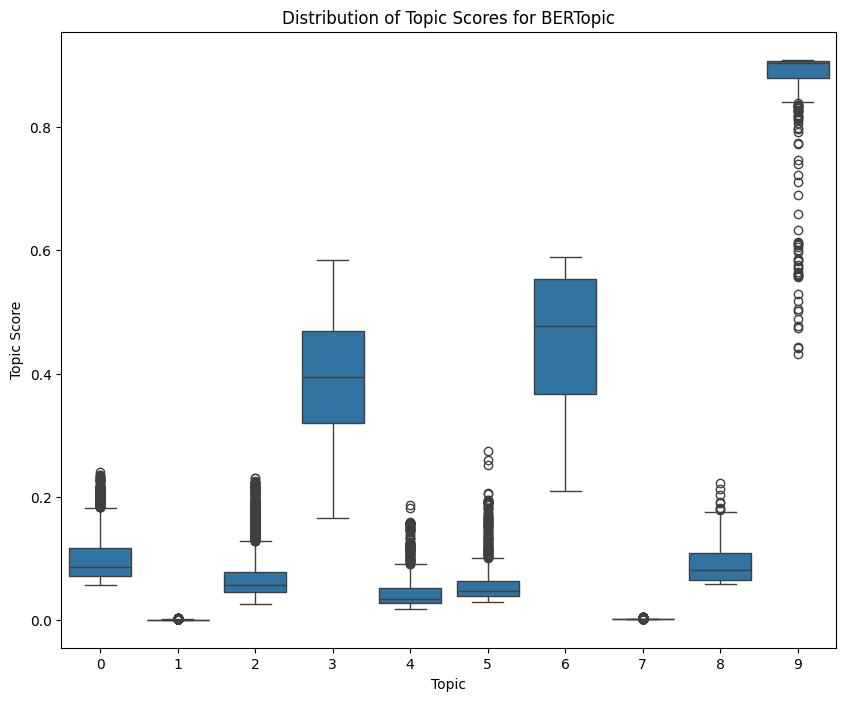

In [105]:
plot_topic_score_distribution(train_BERT, 'topic_BERTopic', 'topic_BERTopic_score', 'BERTopic')

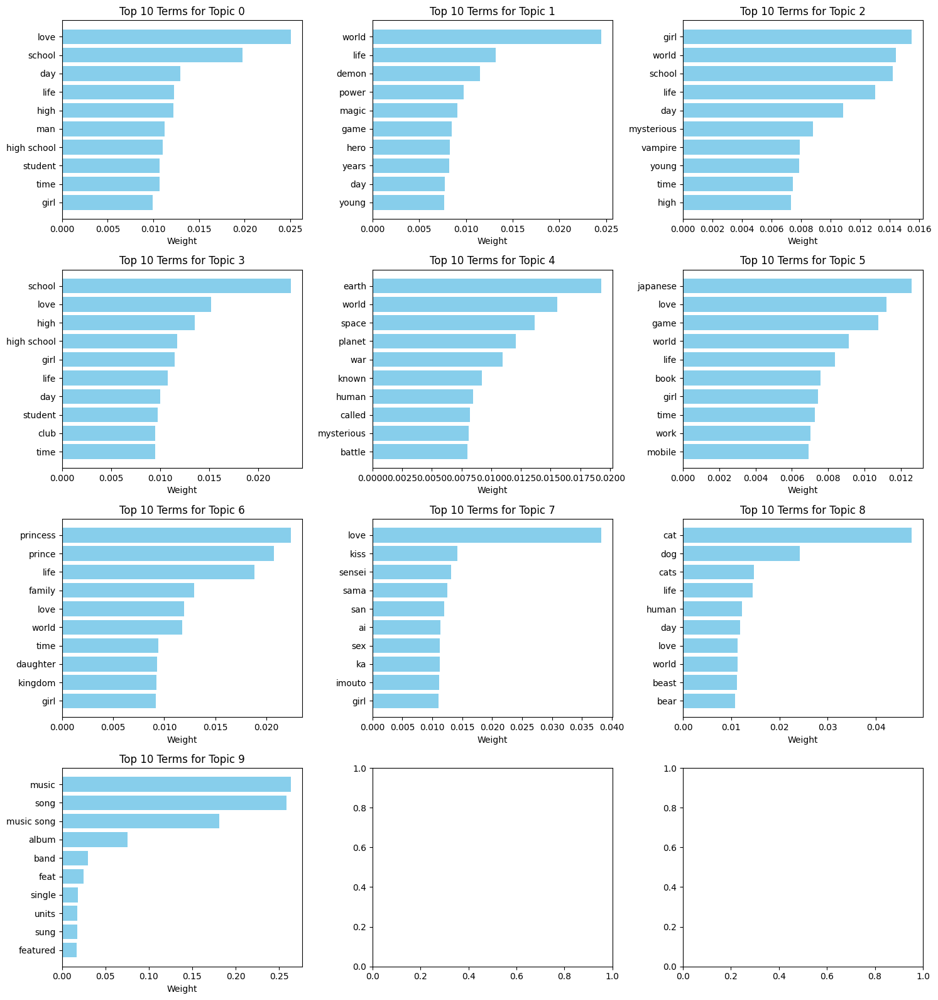

In [107]:
def plot_top_terms_per_topic_BERTopic(model, top_n=10, columns=3):
    topics = model.get_topics()
    num_topics = len(topics)

    # calculate number of rows needed
    rows = (num_topics + columns - 1) // columns

    # set the overall size of the figure
    fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 4))
    axes = axes.flatten()

    # loop through each topic and plot the top terms
    for idx, (topic_num, terms) in enumerate(topics.items()):
        # get the top terms and their weights for the current topic
        terms_sorted = sorted(terms, key=lambda x: x[1], reverse=True)[:top_n]
        top_terms = [term[0] for term in terms_sorted]
        top_weights = [term[1] for term in terms_sorted]
        
        # plot the bar chart for this topic
        ax = axes[idx]
        ax.barh(top_terms, top_weights, color="skyblue")
        ax.set_title(f"Top {top_n} Terms for Topic {topic_num}")
        ax.invert_yaxis()  # invert to have the highest weight at the top
        ax.set_xlabel("Weight")

    plt.tight_layout()
    plt.show()

plot_top_terms_per_topic_BERTopic(best_model, top_n=10, columns=3)

In [108]:
# top 5 confidence for each topic
for topic in range(max(best_model.get_topic_info()['Topic'])+1):
    print('topic: ', topic)
    print(best_model.get_topic_info()['Representation'][topic])
    print(train_BERT[train_BERT['topic_BERTopic']==topic].sort_values('topic_BERTopic_score', ascending=False)['title_japanese'].head(10).tolist())

topic:  0
['love', 'school', 'day', 'life', 'high', 'man', 'high school', 'student', 'time', 'girl']
['飛び降りようとしている女子高生を助けたらどうなるのか?', 'ガール メイ キル', 'あなたの鼓動を見させて。', '逃げる夏', 'ネイビーブルーの星空', '月は東に日は西に ～Operation Sanctuary～', 'ふるえる夜のひみつごと', '久保さんは僕を許さない', '火遊び同盟', 'ローマへの道']
topic:  1
['world', 'life', 'demon', 'power', 'magic', 'game', 'hero', 'years', 'day', 'young']
['BORUTO -NARUTO NEXT GENERATIONS-', 'BORUTO -NARUTO THE MOVIE- ナルトが火影になった日', 'うちはサスケの写輪眼伝', 'NARUTO-ナルト-外伝 ～満ちた月が照らす道～', 'NARUTO -ナルト- 真伝シリーズ', 'BORUTO -NARUTO THE MOVIE-', 'NARUTO-ナルト- 木ノ葉新伝 湯煙忍法帖', '劇場版\u3000NARUTO\u3000大活劇！雪姫忍法帖だってばよ!!', 'NARUTO外伝 七代目火影と緋色の花つ月', 'BORUTO-ボルト- -NARUTO NEXT GENERATIONS-']
topic:  2
['girl', 'world', 'school', 'life', 'day', 'mysterious', 'vampire', 'young', 'time', 'high']
['百合と声と風纏い', 'カゲロウデイズ', '夢でフラれてはじまる百合', 'かくかくしかじか', '사하', 'ゴールデンタイム', '少女巡礼', 'ロジック', 'おはようサイコパス', '看無風景']
topic:  3
['school', 'love', 'high', 'high school', 'girl', 'life', 'day', 'student', 'club', 'time']
['시맨틱 에러', 'ダイスキの

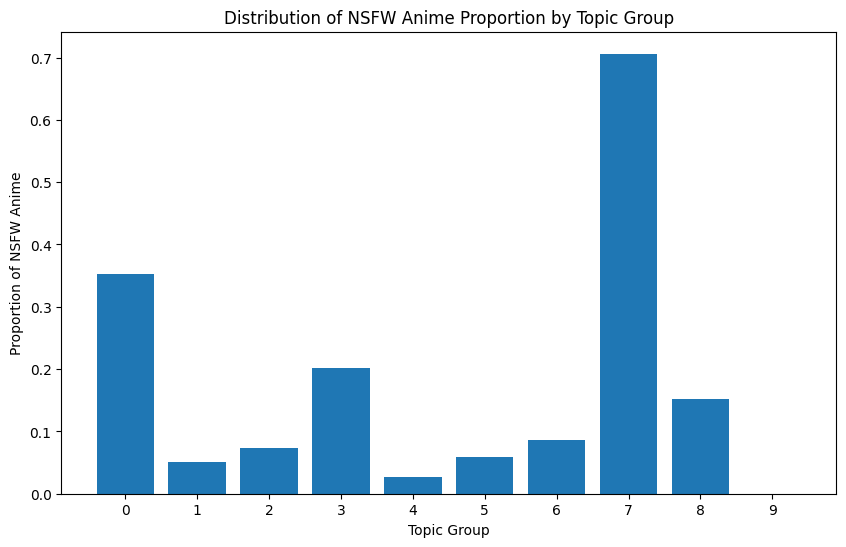

In [111]:
def nsfw_distribution(df, topic_col):
    # calculating proportion of NSFW for each topic group
    topic_nsfw_proportion = df.groupby(topic_col)['sfw'].apply(lambda x: 1 - x.mean()).reset_index()
    topic_nsfw_proportion.columns = [topic_col, 'nsfw_proportion']

    # plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(topic_nsfw_proportion[topic_col], topic_nsfw_proportion['nsfw_proportion'])
    plt.xlabel('Topic Group')
    plt.ylabel('Proportion of NSFW Anime')
    plt.title('Distribution of NSFW Anime Proportion by Topic Group')
    plt.gca().set_xticks(range(len(topic_nsfw_proportion)))
    plt.show()

nsfw_distribution(train_BERT, 'topic_BERTopic')

In [118]:
with pd.option_context('display.max_colwidth', None):
    display(train_BERT[train_BERT['title_japanese'].str.contains('推しの子')][['title_english', 'synopsis', 'topic_BERTopic']])

,title_english,synopsis,topic_BERTopic
8890,[Oshi No Ko],"Sixteen-year-old Ai Hoshino is a talented and beautiful idol who is adored by her fans. She is the personification of a pure, young maiden. But all that glitters is not gold.\n\nGorou Amemiya is a countryside gynecologist and a big fan of Ai. So when the pregnant idol shows up at his hospital, he is beyond bewildered. Gorou promises her a safe delivery. Little does he know, an encounter with a mysterious figure would result in his untimely death—or so he thought.\n\nOpening his eyes in the lap of his beloved idol, Gorou finds that he has been reborn as Aquamarine Hoshino—Ai's newborn son! With his world turned upside down, Gorou soon learns that the world of showbiz is paved with thorns, where talent does not always beget success. Will he manage to protect Ai's smile that he loves so much with the help of an eccentric and unexpected ally?\n\n",0
67,[Oshi No Ko],"In the entertainment world, celebrities often show exaggerated versions of themselves to the public, concealing their true thoughts and struggles beneath elaborate lies. Fans buy into these fabrications, showering their idols with undying love and support, until something breaks the illusion. Sixteen-year-old rising star Ai Hoshino of pop idol group B Komachi has the world captivated; however, when she announces a hiatus due to health concerns, the news causes many to become worried.\n\nAs a huge fan of Ai, gynecologist Gorou Amemiya cheers her on from his countryside medical practice, wishing he could meet her in person one day. His wish comes true when Ai shows up at his hospital—not sick, but pregnant with twins! While the doctor promises Ai to safely deliver her children, he wonders if this encounter with the idol will forever change the nature of his relationship with her.\n\n",0


In [114]:
# store library version
# run every time before you commit
!pip freeze > requirements.txt